# Notebook to check the lateral forcing files

Up till now the lateral forcing files have not been improved. Something seems to be wrong when they are generated. In this notebook I check the files I create and hope to improve the result.

Currently, there are 4 directories called 'model2roms' that I've been using to obtain a better output.

- 'model2roms': the OG folder I used and keep as reference (glorys)
- 'model2roms_ora20c': the OG folder where ORA-20C data is used 
- 'model2roms2': first folder where changes have been made (glorys)
- 'model2roms3': folder where original downloaded glorys data is used


I should keep in mind that the ini input of Tim has a resolution of 1/8°, glorys has a resolution of 1/12° and my own output has a resolution of 1/4°.


In [1]:
import xarray as xr

import matplotlib.pyplot as plt

### Output model2roms comparison to reanalysis input and Tim init

In [2]:
ini_glor_og = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms/output/NorthSea4/NorthSea4_init_GLORYS_19930116_to_20191216.nc')
ini_tim = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/timnorthsea8/NS8_ForcingSmooth01/NS8_init_GLORYS_19930115_to_20021231.nc')
glor_rean = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms/input/glorys.nc')

### Sea level

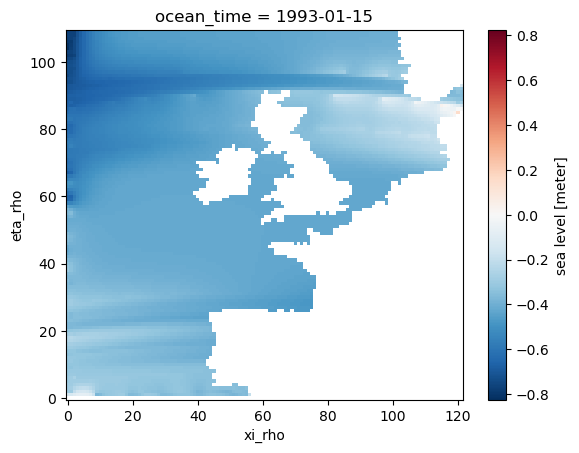

In [3]:
# Plot 1

ini_glor_og.zeta.plot()

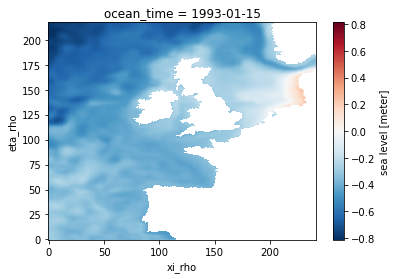

In [4]:
# Plot 2

ini_tim.zeta.plot()

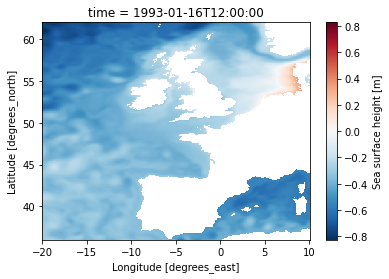

In [5]:
# Plot 3

glor_rean.zos[0,:,:].plot()

### Temperature

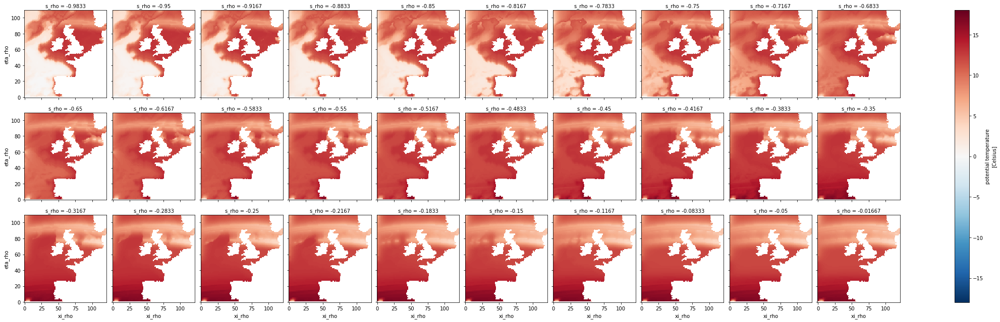

In [6]:
# Plot 4

ini_glor_og.temp.plot(col = 's_rho', col_wrap = 10, vmin = -18, cmap = 'RdBu_r')

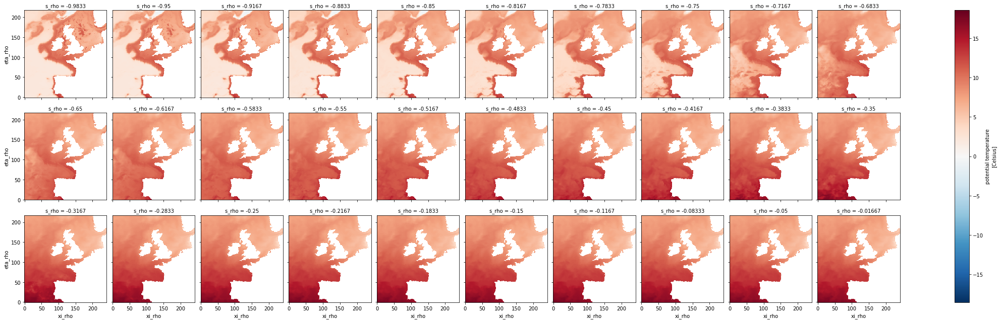

In [7]:
# Plot 5

ini_tim.temp.plot(col = 's_rho', col_wrap = 10)

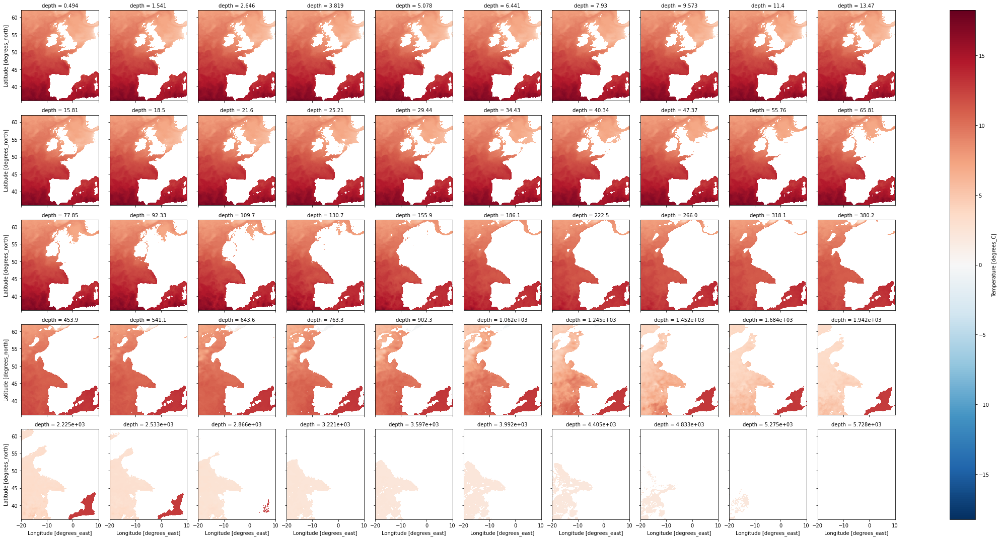

In [8]:
# Plot 6

glor_rean.thetao[0,:,:,:].plot(col = 'depth', col_wrap = 10)

#### Comments

The structure of the data in plot1 is very different from the data in plot 2 & 3. Even taking into account the different resolution, this cannot be the correct output. 


Especially there are some weird horizontal structures

### Output model2roms_ora20c comparison to reanalysis input 

In [9]:
ini_ora = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms_ora20c/output/NorthSea4/NorthSea4_init_ORA20C_19500116_to_20091216.nc')
ora_rean = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms_ora20c/input/ora20c.nc')

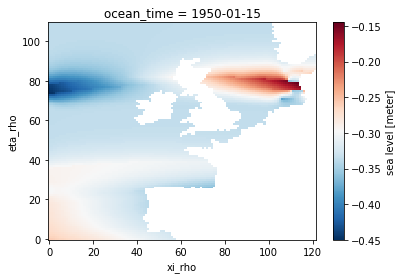

In [10]:
ini_ora.zeta.plot(cmap = 'RdBu_r')

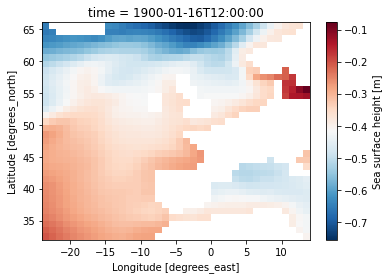

In [13]:
ora_rean.zos[0,:,:].sortby(['latitude', 'longitude']).plot(cmap = 'RdBu_r')

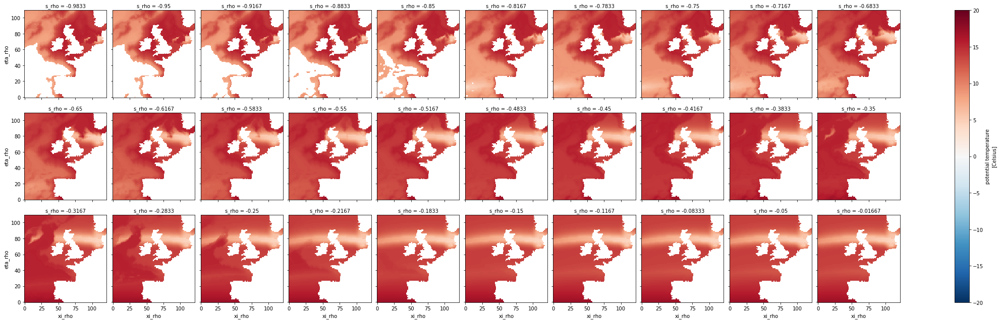

In [15]:
ini_ora.temp.plot(col = 's_rho', col_wrap = 10, cmap = 'RdBu_r', vmin = -20, vmax = 20)

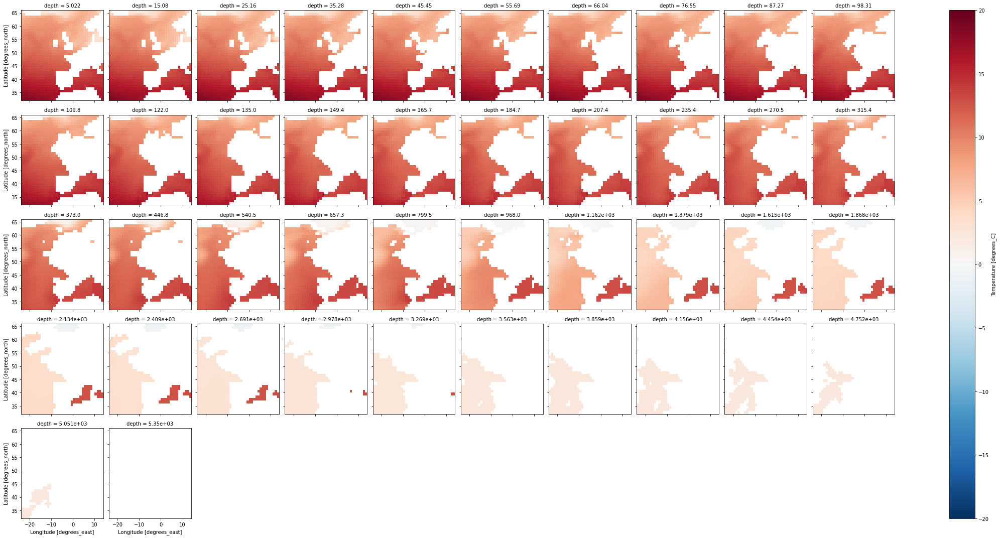

In [16]:
ora_rean.thetao[0,:,:,:].sortby(['latitude', 'longitude']).plot(col = 'depth', col_wrap = 10, cmap = 'RdBu_r', vmin = -20, vmax = 20)

In [24]:
ora_rean.zos.sortby(['time', 'latitude', 'longitude']).plot(col = 'time', col_wrap = 10)

### Comments

Here, an important thing that should be changed is the extent of the ORA-20C data

### Output model2roms3 comparison to reanalysis input and Tim init

In [107]:
ini_glor3 = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms3/output/NS_test/NS_test_init_GLORYS_19930116_to_20031216.nc')
ini_tim = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/timnorthsea8/NS8_ForcingSmooth01/NS8_init_GLORYS_19930115_to_20021231.nc')
glor_rean = xr.open_mfdataset('/Users/iriskeizer/Documents/ROMS/data/GLORYS12V1/downloads/CMEMS_SSH_GLORYS12v1_*.nc')

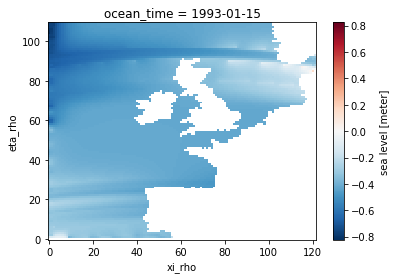

In [108]:
ini_glor3.zeta.plot()

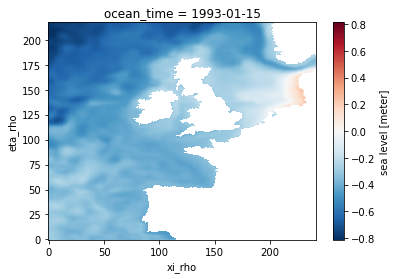

In [109]:
ini_tim.zeta.plot()

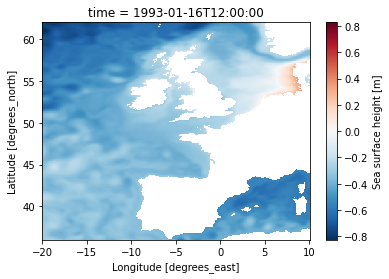

In [110]:
glor_rean.zos[0,:,:].plot()

In [54]:
clim_glor3 = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms3/output/NS_test/NS_test_clim_GLORYS_19930116_to_20031216.nc')

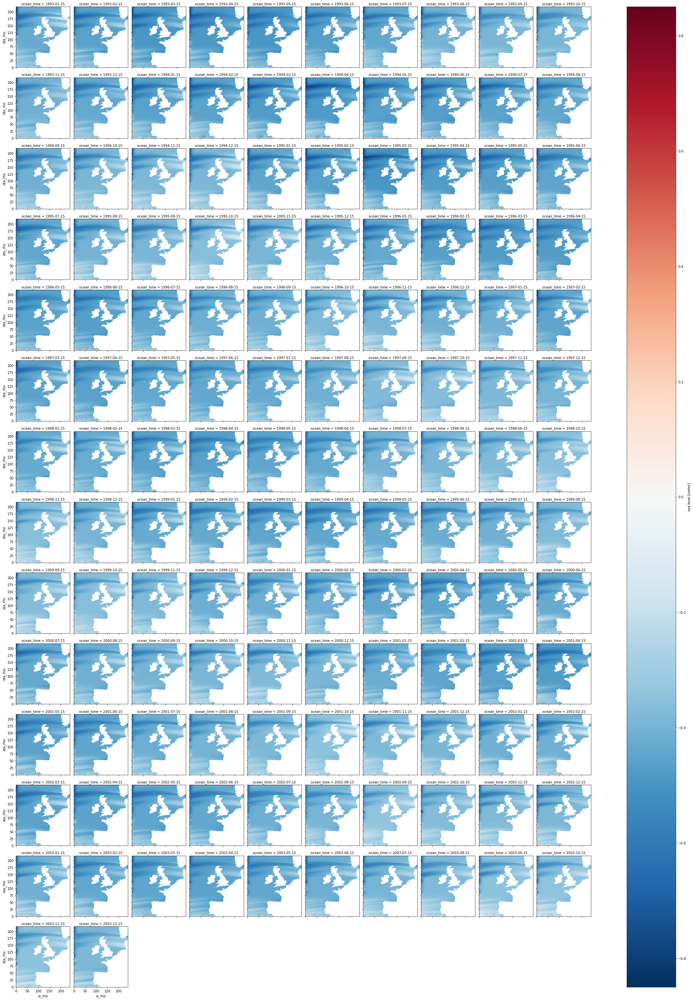

In [56]:
clim_glor3.zeta.plot(col = 'ocean_time', col_wrap = 10)

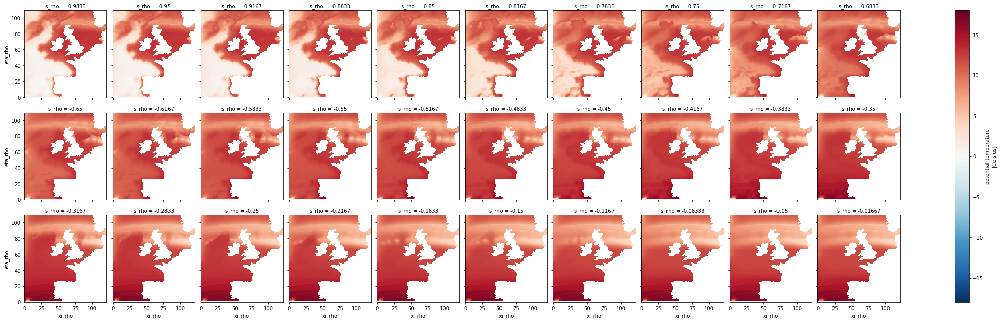

In [121]:
ini_glor3.temp.plot(col = 's_rho', col_wrap = 10, cmap = 'RdBu_r', vmin = -18, vmax = 18)

In [118]:
glor_rean_th = xr.open_mfdataset('/Users/iriskeizer/Documents/ROMS/data/GLORYS12V1/downloads/CMEMS_PotTemp_GLORYS12v1_*.nc')

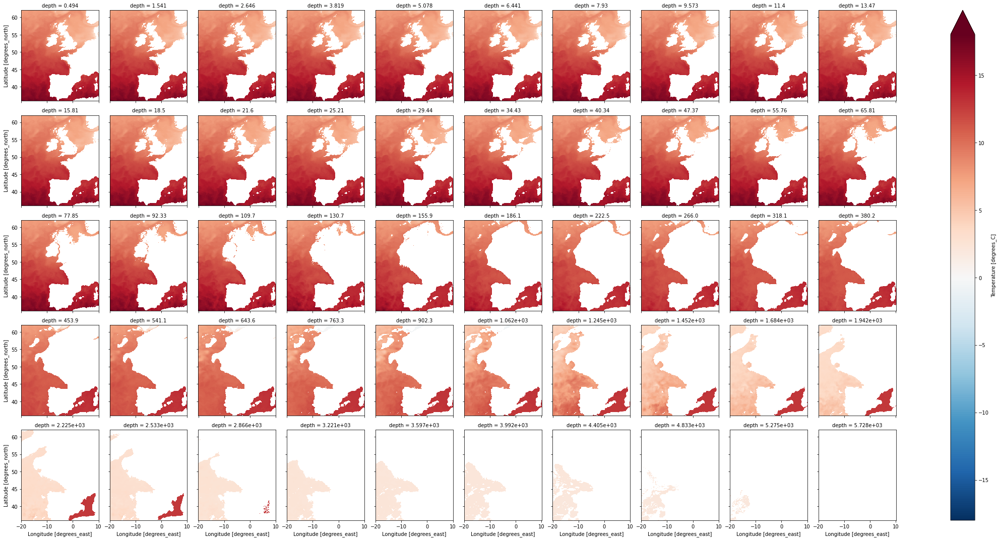

In [122]:
glor_rean_th.thetao[0,:,:,:].plot(col = 'depth', col_wrap = 10, cmap = 'RdBu_r', vmin = -18, vmax = 18)

### Comments

Using these Glorys data sets the init file still isn't correct.

### Check grid files

In [2]:
grid_dewi = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/code/model2roms3/NorthSea4_smooth01_sponge_nudg.nc')
grid_tim = xr.open_dataset('/Users/iriskeizer/Documents/ROMS/data/Tim/model_input/NorthSea8_smooth013_sponge_nudg.nc')

In [100]:
grid_dewi.lon_rho[0,:]

<xarray.DataArray 'lon_rho' (xi_rho: 122)>
array([-19.877049, -19.631148, -19.385246, -19.139344, -18.893443, -18.647541,
       -18.401639, -18.155738, -17.909836, -17.663934, -17.418033, -17.172131,
       -16.92623 , -16.680328, -16.434426, -16.188525, -15.942623, -15.696721,
       -15.45082 , -15.204918, -14.959016, -14.713115, -14.467213, -14.221311,
       -13.97541 , -13.729508, -13.483607, -13.237705, -12.991803, -12.745902,
       -12.5     , -12.254098, -12.008197, -11.762295, -11.516393, -11.270492,
       -11.02459 , -10.778689, -10.532787, -10.286885, -10.040984,  -9.795082,
        -9.54918 ,  -9.303279,  -9.057377,  -8.811475,  -8.565574,  -8.319672,
        -8.07377 ,  -7.827869,  -7.581967,  -7.336066,  -7.090164,  -6.844262,
        -6.598361,  -6.352459,  -6.106557,  -5.860656,  -5.614754,  -5.368852,
        -5.122951,  -4.877049,  -4.631148,  -4.385246,  -4.139344,  -3.893443,
        -3.647541,  -3.401639,  -3.155738,  -2.909836,  -2.663934,  -2.418033,
        -2.172131,  -1.92623 ,  -1.680328,  -1.434426,  -1.188525,  -0.942623,
        -0.696721,  -0.45082 ,  -0.204918,   0.040984,   0.286885,   0.532787,
         0.778689,   1.02459 ,   1.270492,   1.516393,   1.762295,   2.008197,
         2.254098,   2.5     ,   2.745902,   2.991803,   3.237705,   3.483607,
         3.729508,   3.97541 ,   4.221311,   4.467213,   4.713115,   4.959016,
         5.204918,   5.45082 ,   5.696721,   5.942623,   6.188525,   6.434426,
         6.680328,   6.92623 ,   7.172131,   7.418033,   7.663934,   7.909836,
         8.155738,   8.401639,   8.647541,   8.893443,   9.139344,   9.385246,
         9.631148,   9.877049])
Dimensions without coordinates: xi_rho
Attributes:
    long_name:  longitude of RHO-points
    units:      degree_east

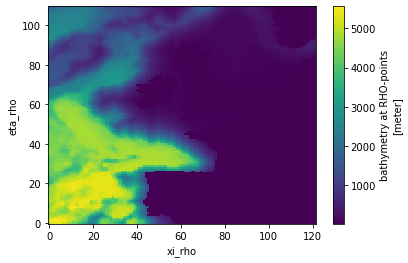

In [106]:
grid_dewi.h.plot()

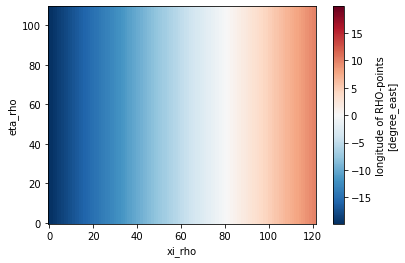

In [37]:
grid_dewi.lon_rho.plot()

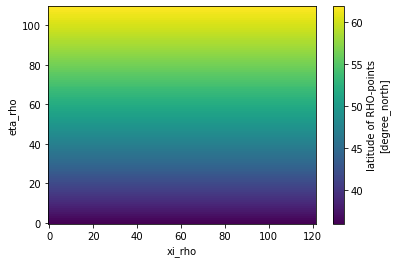

In [123]:
grid_dewi.lat_rho.plot()

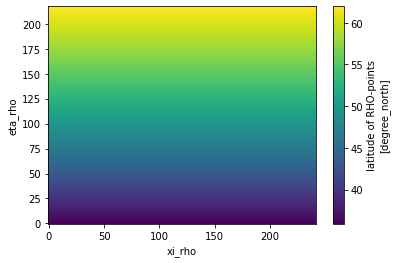

In [43]:
grid_tim.lat_rho.plot()

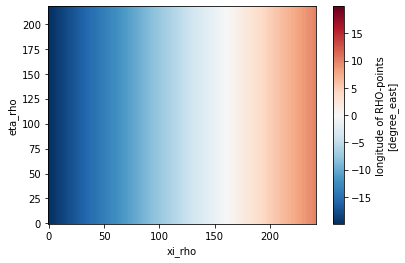

In [44]:
grid_tim.lon_rho.plot()

In [49]:
grid_tim.Tcline

<xarray.Dataset>
Dimensions:           (s_rho: 30, s_w: 31, eta_rho: 218, xi_rho: 242, bath: 1, eta_u: 218, xi_u: 241, eta_v: 217, xi_v: 242, eta_psi: 217, xi_psi: 241, eta_vert: 219, xi_vert: 243)
Coordinates:
  * s_rho             (s_rho) float64 -0.9833 -0.95 -0.9167 ... -0.05 -0.01667
  * s_w               (s_w) float64 -1.0 -0.9667 -0.9333 ... -0.03333 0.0
Dimensions without coordinates: eta_rho, xi_rho, bath, eta_u, xi_u, eta_v, xi_v, eta_psi, xi_psi, eta_vert, xi_vert
Data variables: (12/44)
    theta_s           float64 7.0
    theta_b           float64 2.0
    Tcline            float64 50.0
    hc                float64 50.0
    Cs_r              (s_rho) float64 -0.9614 -0.8737 ... -0.0002615 -2.879e-05
    Cs_w              (s_w) float64 -1.0 -0.919 -0.8261 ... -0.0001156 0.0
    ...                ...
    mask_u            (eta_u, xi_u) float64 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    mask_v            (eta_v, xi_v) float64 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0 0.0
    mask_psi          (eta_psi, xi_psi) float64 1.0 1.0 1.0 1.0 ... 0.0 0.0 0.0
    tracer_NudgeCoef  (s_rho, eta_rho, xi_rho) float64 ...
    visc_factor       (eta_rho, xi_rho) float64 10.0 10.0 10.0 ... 10.0 10.0 1.0
    diff_factor       (eta_rho, xi_rho) float64 10.0 10.0 10.0 ... 10.0 10.0 1.0
Attributes:
    Description:  ROMS grid
    Author:       pyroms.grid.write_grd
    Created:      2019-11-18T17:05:41.602525
    type:         ROMS grid file

In [10]:
grid_dewi["mask_rho"][0, :]

<xarray.DataArray 'mask_rho' (xi_rho: 122)>
array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Dimensions without coordinates: xi_rho
Attributes:
    long_name:  mask on RHO-points

In [95]:
grid_dewi["lat_rho"][:, :][1, :]

<xarray.DataArray 'lat_rho' (xi_rho: 122)>
array([36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326, 36.254326, 36.254326, 36.254326, 36.254326,
       36.254326, 36.254326])
Dimensions without coordinates: xi_rho
Attributes:
    long_name:  latitude of RHO-points
    units:      degree_north

In [8]:
grid_dewi.spherical.encoding

{'source': '/Users/iriskeizer/Documents/ROMS/code/model2roms3/NorthSea4_smooth01_sponge_nudg.nc',
 'original_shape': (),
 'dtype': dtype('S1')}

In [4]:
11.3 * 3 * 12 * 5

2034.0000000000005